In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import seaborn as sns
import matplotlib.pyplot as plt

sc.settings.verbosity = 3 
sc.settings.set_figure_params(dpi=250)

# Read Files

## Bovine

In [3]:
counts = sc.read_h5ad('Data/adata.h5ad')

In [4]:
counts = counts[counts.obs.data=='data0_Carlos'].copy()

## Human

In [5]:
adatas = []
for i in ["119", "120", '121', "122"]:
  adatas.append(sc.read_h5ad("Data/Human/adata" + i + ".h5ad"))
  if i in ['120', '122']:
    adatas[-1].obs['Origin'] = ['Blastocyst' for i in adatas[-1].obs.index]
  else:
    adatas[-1].obs['Origin'] = ['Blastoid' for i in adatas[-1].obs.index]
  print(adatas[-1])

AnnData object with n_obs × n_vars = 2246 × 33538
    obs: 'batch', 'num_umis', 'num_features', 'mt_percentage', 'Origin'
    var: 'feature', 'symbol'
AnnData object with n_obs × n_vars = 550 × 33538
    obs: 'batch', 'num_umis', 'num_features', 'mt_percentage', 'Origin'
    var: 'feature', 'symbol'
AnnData object with n_obs × n_vars = 5660 × 33538
    obs: 'batch', 'num_umis', 'num_features', 'mt_percentage', 'Origin'
    var: 'feature', 'symbol'
AnnData object with n_obs × n_vars = 375 × 33538
    obs: 'batch', 'num_umis', 'num_features', 'mt_percentage', 'Origin'
    var: 'feature', 'symbol'


In [6]:
blastocyst = pd.read_csv("Data/Human/LW119_blastocyst_snp20.txt", header=None)

In [7]:
adatas[0].obs.loc[adatas[0].obs.index.isin(blastocyst[0].values), 'Origin'] = 'Blastocyst'

In [8]:
adata2 = sc.concat(adatas)

In [9]:
adata2.var["symbol"] = [i.split("_")[1] for i in adata2.var.index]
adata2.var["ensembl"] = [i for i in adata2.var.index]

In [10]:
adata2.var_names = adata2.var.symbol
adata2.var_names_make_unique()
adata2

AnnData object with n_obs × n_vars = 8831 × 33538
    obs: 'batch', 'num_umis', 'num_features', 'mt_percentage', 'Origin'
    var: 'symbol', 'ensembl'

## Merge

In [11]:
counts.obs['batch'] = ['bovine' for i in counts.obs.index]
counts.obs['Origin'] = ['Blastoid' for i in counts.obs.index]
counts.obs['species'] = ['bovine' for i in counts.obs.index]
counts.obs['num_umis'] = [i for i in counts.obs['nCount_RNA']]
counts.obs['num_features'] = [i for i in counts.obs['nFeature_RNA']]
counts.obs['mt_percentage'] = [i for i in counts.obs['percent.mt']]

adata2.obs['species'] = ['human' for i in adata2.obs.index]

In [12]:
adata = sc.concat([counts, adata2])
adata

AnnData object with n_obs × n_vars = 12376 × 15915
    obs: 'batch', 'Origin', 'species', 'num_umis', 'num_features', 'mt_percentage'

# QC and preprocessing

normalizing counts per cell
    finished (0:00:01)


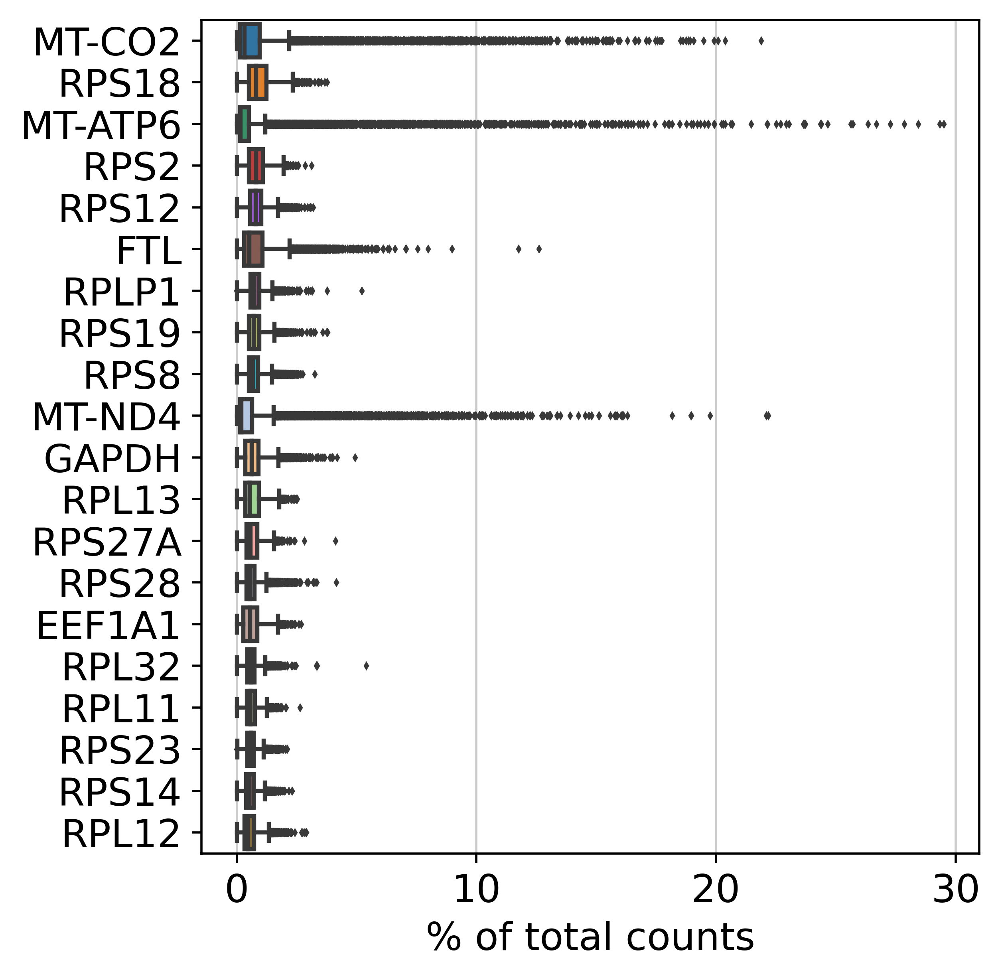

In [13]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [14]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 6 cells that have less than 200 genes expressed
filtered out 941 genes that are detected in less than 3 cells


In [15]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

<Axes: ylabel='mt_percentage'>

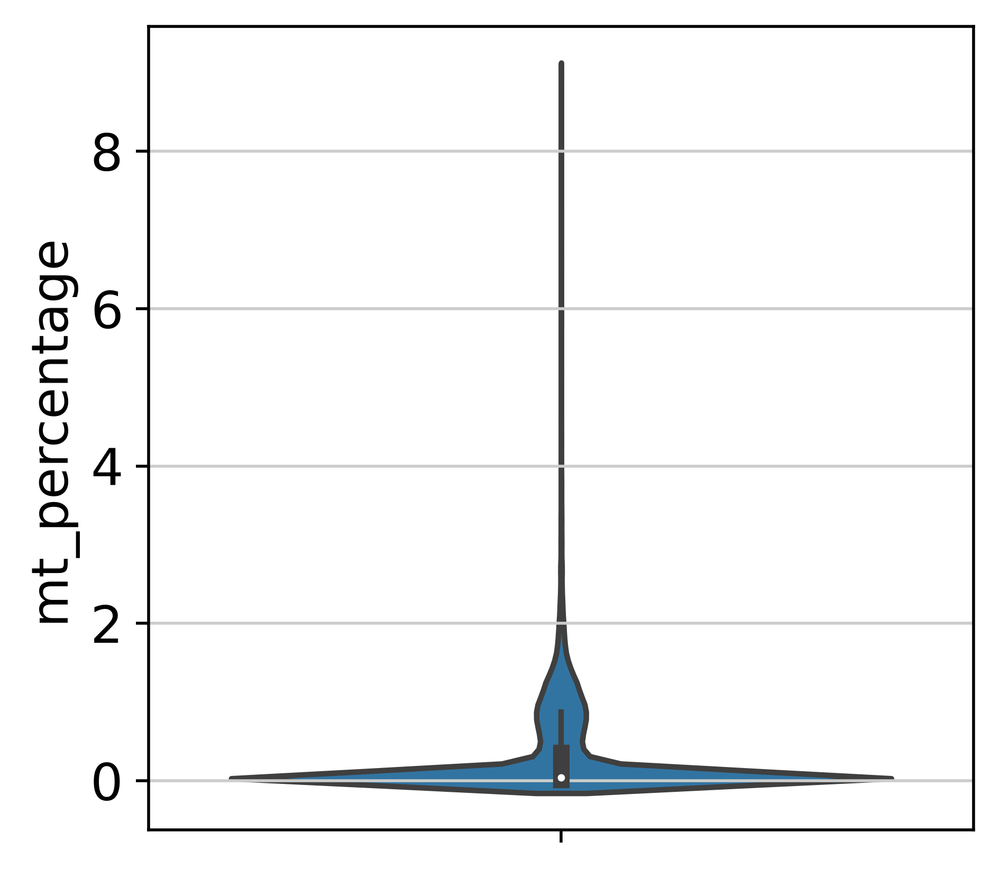

In [16]:
sns.violinplot(y = adata.obs["mt_percentage"])

<Axes: ylabel='n_genes_by_counts'>

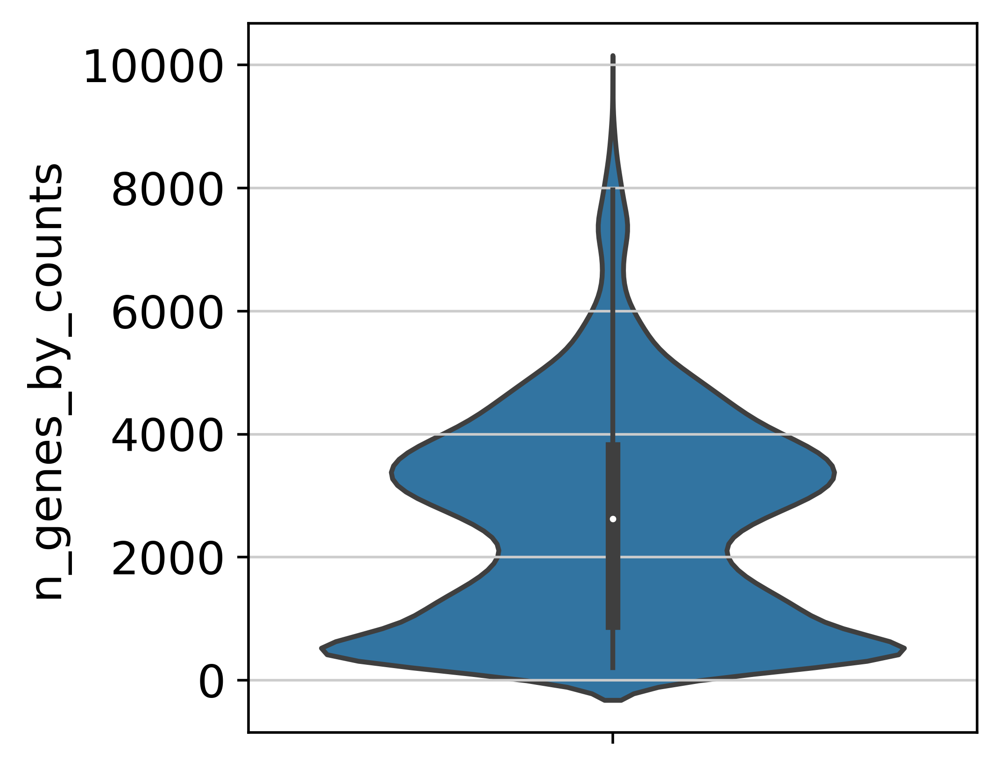

In [17]:
sns.violinplot(y = adata.obs.n_genes_by_counts)

<Axes: xlabel='species', ylabel='total_counts'>

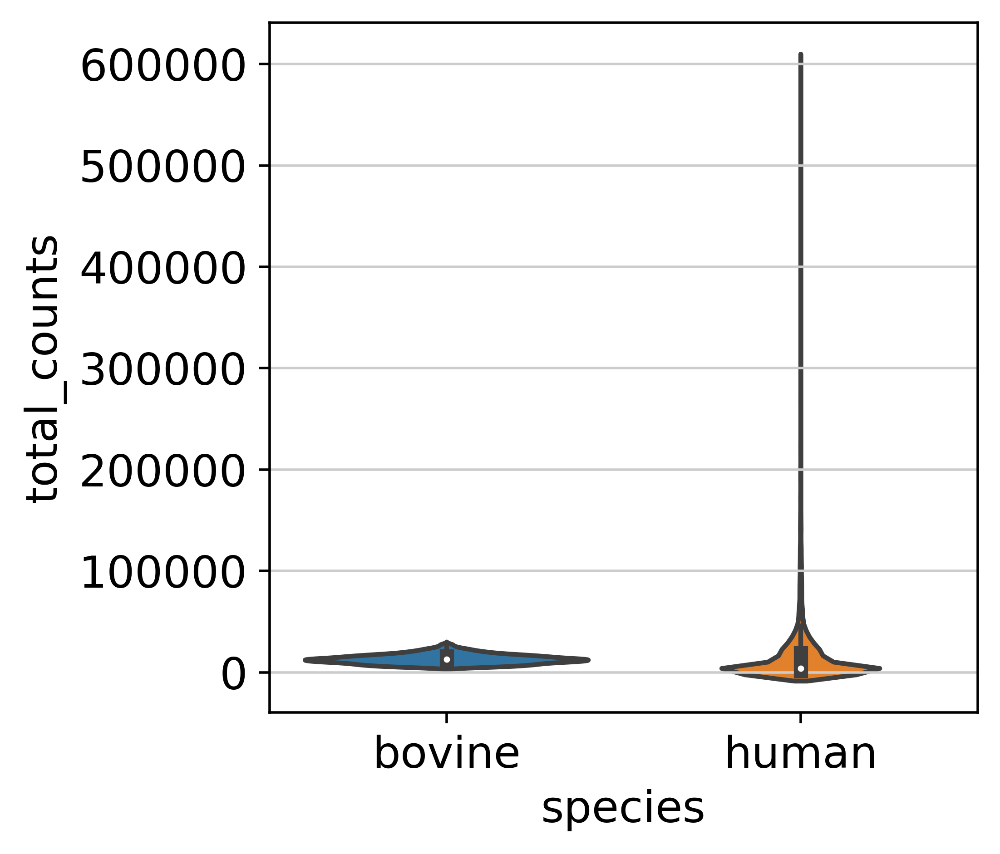

In [18]:
sns.violinplot(y = adata.obs.total_counts, x=adata.obs.species)

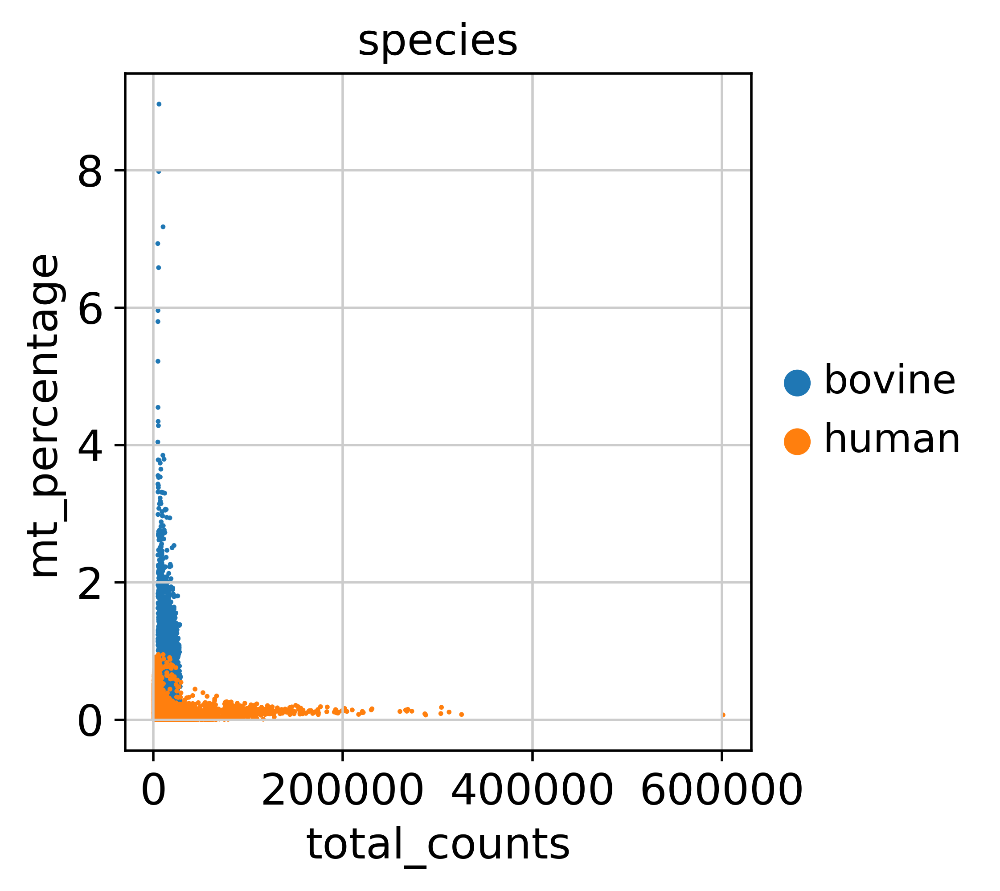

In [19]:
sc.pl.scatter(adata, x='total_counts', y='mt_percentage', color='species')


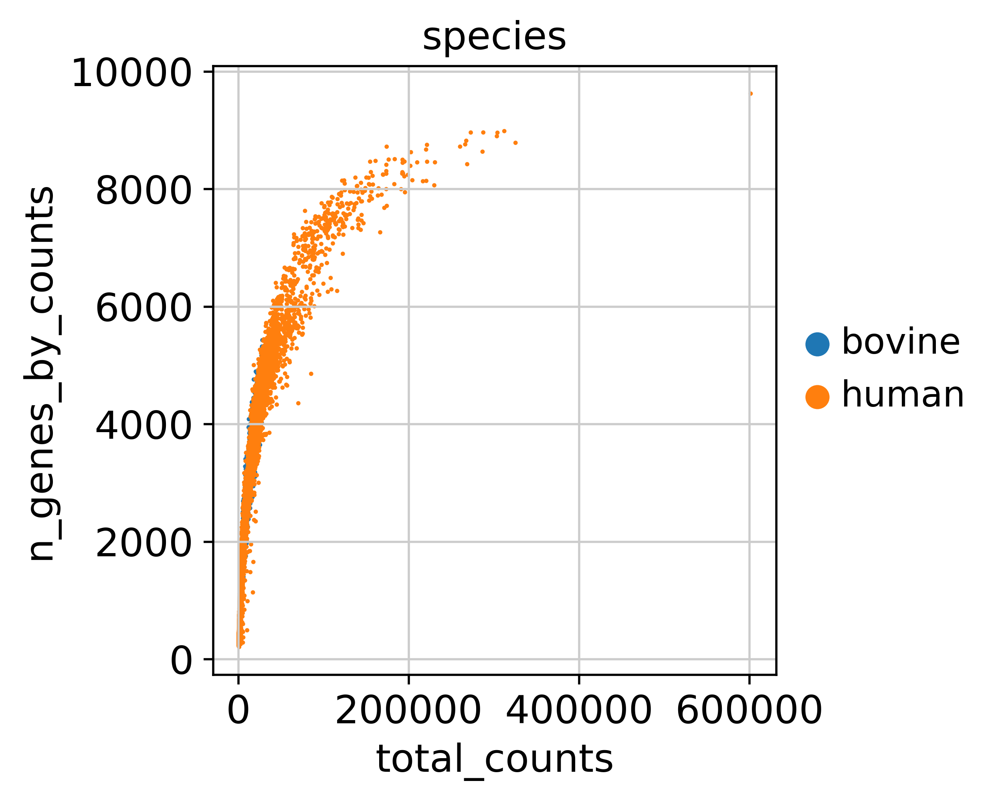

In [20]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='species')


In [21]:
adata

AnnData object with n_obs × n_vars = 12370 × 14974
    obs: 'batch', 'Origin', 'species', 'num_umis', 'num_features', 'mt_percentage', 'n_genes', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'species_colors'

In [22]:
adata = adata[adata.obs.total_counts<200000]
adata = adata[adata.obs.mt_percentage<4]
adata = adata[adata.obs.n_genes_by_counts>2000]

In [23]:
adata

View of AnnData object with n_obs × n_vars = 7092 × 14974
    obs: 'batch', 'Origin', 'species', 'num_umis', 'num_features', 'mt_percentage', 'n_genes', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'species_colors'

In [24]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/usr/local/lib/python3.9/dist-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell


/usr/local/lib/python3.9/dist-packages/scanpy/preprocessing/_normalization.py:170: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)


    finished (0:00:00)


In [25]:
adata.raw = adata

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


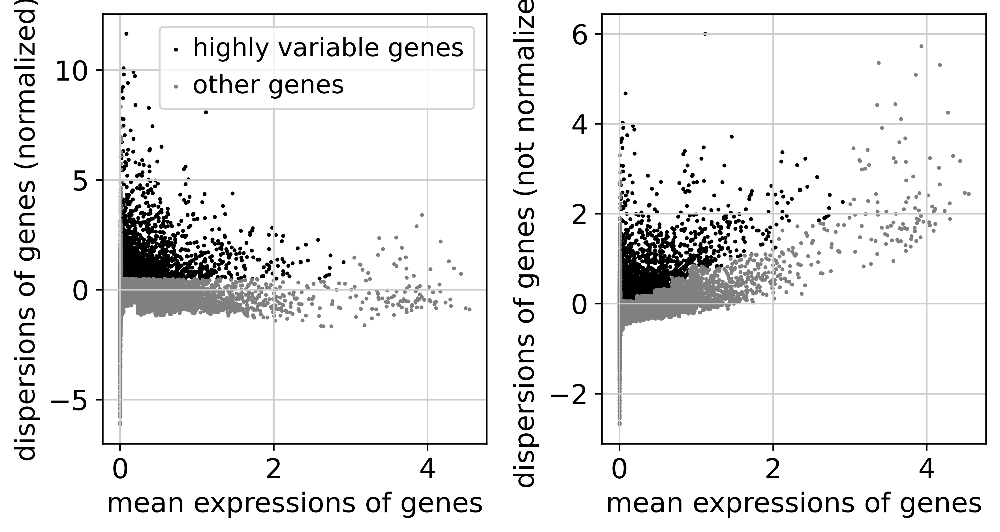

In [26]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

In [27]:
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


# Cell Cycle

In [28]:
# Reference:
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4481139/#SD8, table S2
s = ['ABCC5', 'ABHD10', 'ANKRD18A', 'ASF1B', 'ATAD2', 'BBS2', 'BIVM', 'BLM', 'BMI1', 'BRCA1', 'BRIP1', 'C5orf42', 'C11orf82', 'CALD1', 'CALM2', 'CASP2', 'CCDC14', 'CCDC84', 'CCDC150', 'CDC7', 'CDC45', 'CDCA5', 'CDKN2AIP', 'CENPM', 'CENPQ', 'CERS6', 'CHML', 'COQ9', 'CPNE8', 'CREBZF', 'CRLS1', 'DCAF16', 'DEPDC7', 'DHFR', 'DNA2', 'DNAJB4', 'DONSON', 'DSCC1', 'DYNC1LI2', 'E2F8', 'EIF4EBP2', 'ENOSF1', 'ESCO2', 'EXO1', 'EZH2', 'FAM178A', 'FANCA', 'FANCI', 'FEN1', 'GCLM', 'GOLGA8A', 'GOLGA8B', 'H1F0', 'HELLS', 'HIST1H2AC', 'HIST1H4C', 'INTS7', 'KAT2A', 'KAT2B', 'KDELC1', 'KIAA1598', 'LMO4', 'LYRM7', 'MAN1A2', 'MAP3K2', 'MASTL', 'MBD4', 'MCM8', 'MLF1IP', 'MYCBP2', 'NAB1', 'NEAT1', 'NFE2L2', 'NRD1', 'NSUN3', 'NT5DC1', 'NUP160', 'OGT', 'ORC3', 'OSGIN2', 'PHIP', 'PHTF1', 'PHTF2', 'PKMYT1', 'POLA1', 'PRIM1', 'PTAR1', 'RAD18', 'RAD51', 'RAD51AP1', 'RBBP8', 'REEP1', 'RFC2', 'RHOBTB3', 'RMI1', 'RPA2', 'RRM1', 'RRM2', 'RSRC2', 'SAP30BP', 'SLC38A2', 'SP1', 'SRSF5', 'SVIP', 'TOP2A', 'TTC31', 'TTLL7', 'TYMS', 'UBE2T', 'UBL3', 'USP1', 'ZBED5', 'ZWINT']
g2m = ['ANLN', 'AP3D1', 'ARHGAP19', 'ARL4A', 'ARMC1', 'ASXL1', 'ATL2', 'AURKB', 'BCLAF1', 'BORA', 'BRD8', 'BUB3', 'C2orf69', 'C14orf80', 'CASP3', 'CBX5', 'CCDC107', 'CCNA2', 'CCNF', 'CDC16', 'CDC25C', 'CDCA2', 'CDCA3', 'CDCA8', 'CDK1', 'CDKN1B', 'CDKN2C', 'CDR2', 'CENPL', 'CEP350', 'CFD', 'CFLAR', 'CHEK2', 'CKAP2', 'CKAP2L', 'CYTH2', 'DCAF7', 'DHX8', 'DNAJB1', 'ENTPD5', 'ESPL1', 'FADD', 'FAM83D', 'FAN1', 'FANCD2', 'G2E3', 'GABPB1', 'GAS1', 'GAS2L3', 'H2AFX', 'HAUS8', 'HINT3', 'HIPK2', 'HJURP', 'HMGB2', 'HN1', 'HP1BP3', 'HRSP12', 'IFNAR1', 'IQGAP3', 'KATNA1', 'KCTD9', 'KDM4A', 'KIAA1524', 'KIF5B', 'KIF11', 'KIF20B', 'KIF22', 'KIF23', 'KIFC1', 'KLF6', 'KPNA2', 'LBR', 'LIX1L', 'LMNB1', 'MAD2L1', 'MALAT1', 'MELK', 'MGAT2', 'MID1', 'MIS18BP1', 'MND1', 'NCAPD3', 'NCAPH', 'NCOA5', 'NDC80', 'NEIL3', 'NFIC', 'NIPBL', 'NMB', 'NR3C1', 'NUCKS1', 'NUMA1', 'NUSAP1', 'PIF1', 'PKNOX1', 'POLQ', 'PPP1R2', 'PSMD11', 'PSRC1', 'RANGAP1', 'RCCD1', 'RDH11', 'RNF141', 'SAP30', 'SKA3', 'SMC4', 'STAT1', 'STIL', 'STK17B', 'SUCLG2', 'TFAP2A', 'TIMP1', 'TMEM99', 'TMPO', 'TNPO2', 'TOP2A', 'TRAIP', 'TRIM59', 'TRMT2A', 'TTF2', 'TUBA1A', 'TUBB', 'TUBB2A', 'TUBB4B', 'TUBD1', 'UACA', 'UBE2C', 'VPS25', 'VTA1', 'WSB1', 'ZNF587', 'ZNHIT2']

In [29]:
s_conv = [adata.var.loc[adata.var_names==i, :].index[0] for i in s if len(adata.var.loc[adata.var_names==i, :].index)>0]
g2m_conv = [adata.var.loc[adata.var_names==i, :].index[0] for i in g2m if len(adata.var.loc[adata.var_names==i, :].index)>0]

In [30]:
print(len(s))
print(len(s_conv))
print(len(g2m))
print(len(g2m_conv))

113
98
133
123


In [31]:
sc.tl.score_genes_cell_cycle(adata, s_genes = s_conv, g2m_genes = g2m_conv)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    1745 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    1841 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


<Axes: xlabel='Score', ylabel='Count'>

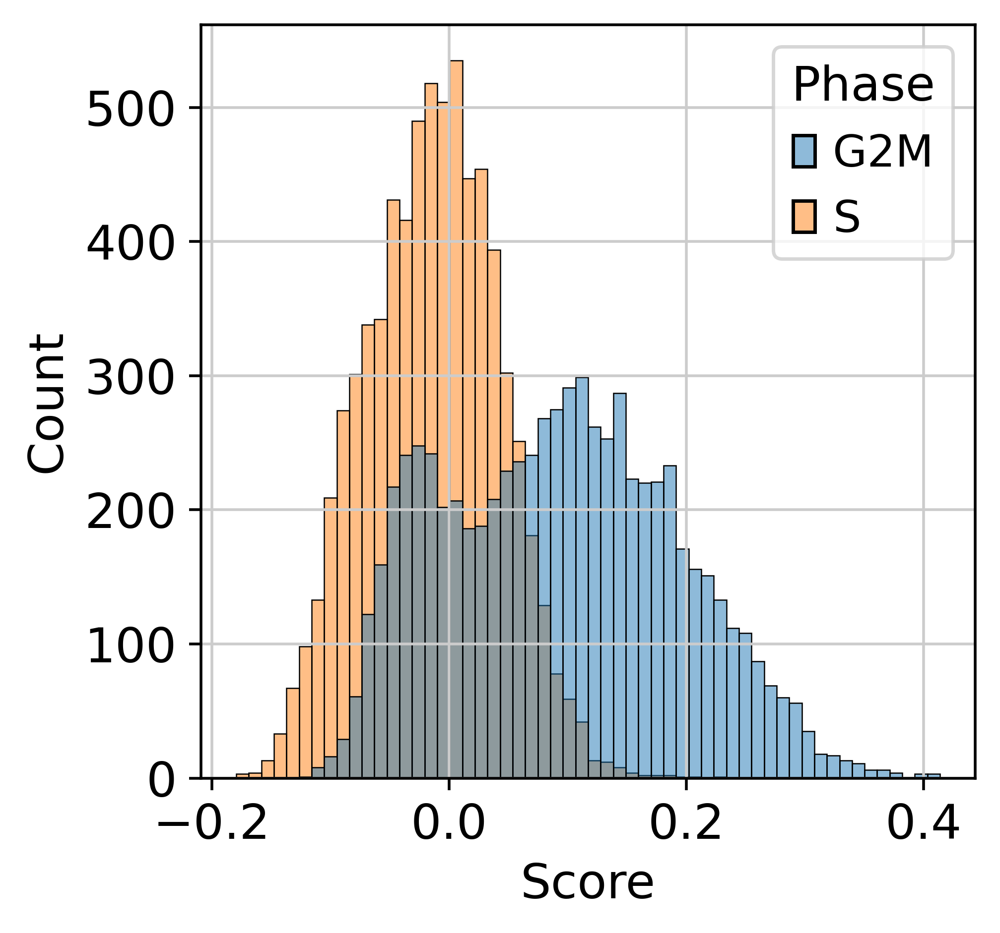

In [32]:
gscores = pd.DataFrame({'Score': adata.obs.G2M_score, 'Phase':['G2M' for i in range(len(adata.obs.G2M_score))]})
sscores = pd.DataFrame({'Score': adata.obs.S_score, 'Phase':['S' for i in range(len(adata.obs.G2M_score))]})
to_plot = pd.concat([gscores, sscores])
to_plot.reset_index(inplace=True)
sns.histplot(to_plot, x='Score', hue='Phase')

In [33]:
cell_cycle_genes = s_conv + g2m_conv
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color=['phase', 'species', 'batch', 'Origin', 'total_counts', 'n_genes', 'mt_percentage'], ncols=2)

Output hidden; open in https://colab.research.google.com to view.

In [34]:
k = ['S_score', 'G2M_score', 'mt_percentage']
#k = ['mt_percentage', 'n_genes']
sc.pp.regress_out(adata, k)
sc.pp.scale(adata)

regressing out ['S_score', 'G2M_score', 'mt_percentage']
    finished (0:04:58)


In [35]:
adata_cc_genes = adata[:, cell_cycle_genes]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color=['phase', 'species', 'batch', 'Origin', 'total_counts', 'mt_percentage', 'n_genes'], ncols=2)

Output hidden; open in https://colab.research.google.com to view.

# Plotting

In [36]:
sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [37]:
sc.pl.pca(adata, color=["total_counts", "mt_percentage", "n_genes", "Origin", 'species', 'batch'], ncols=2)

Output hidden; open in https://colab.research.google.com to view.

In [38]:
sc.pp.neighbors(adata)
sc.tl.umap(adata, min_dist=0.3)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


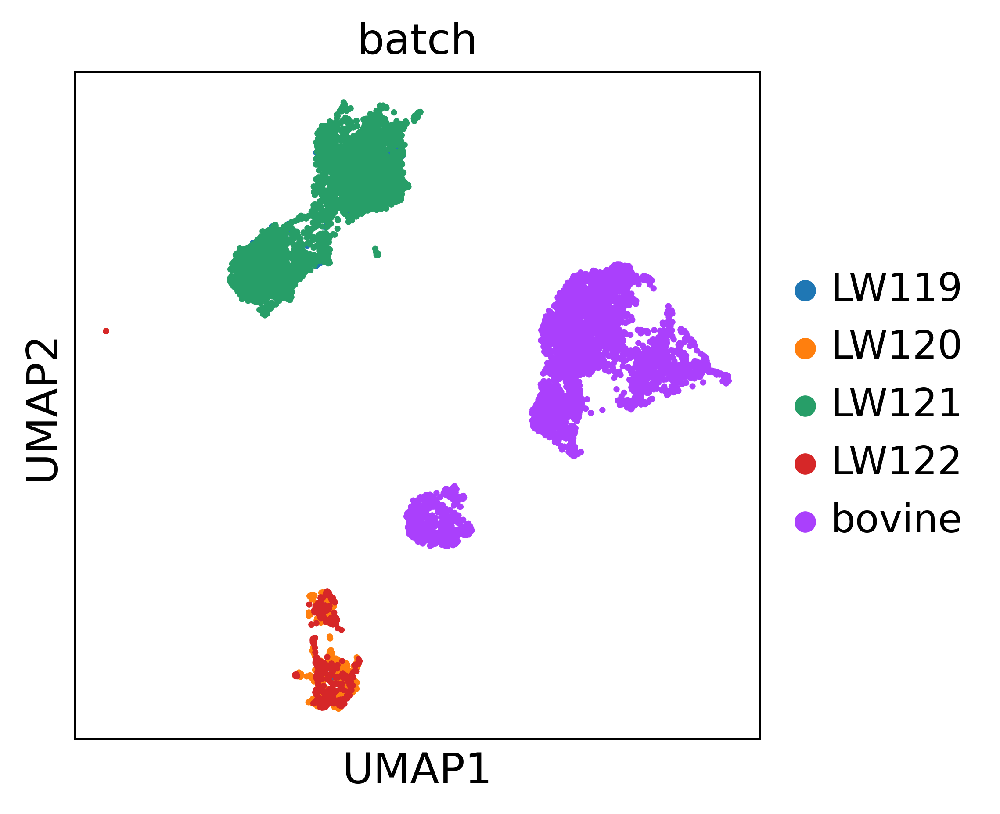

In [39]:
sc.pl.umap(adata, color="batch")

In [40]:
sc.external.pp.bbknn(adata, batch_key='batch', neighbors_within_batch=3)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [41]:
sc.tl.umap(adata, min_dist=0.4)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


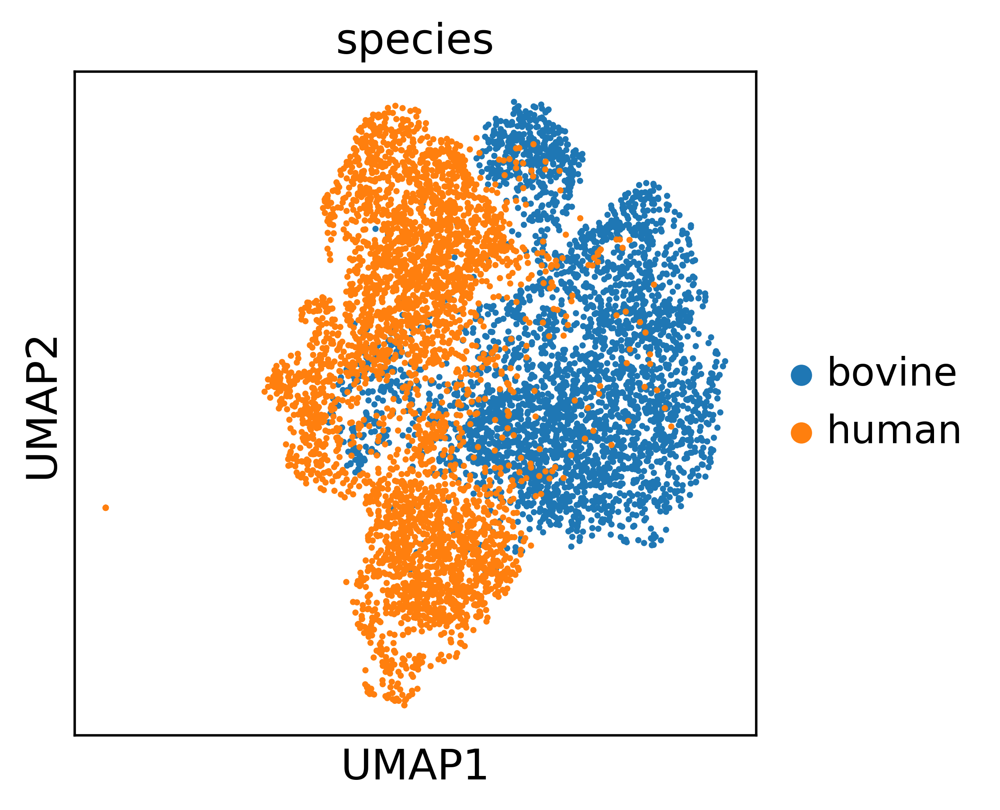

In [42]:
sc.pl.umap(adata, color='species', show=False)
plt.savefig('Figures/S2T_species.pdf', bbox_inches="tight")

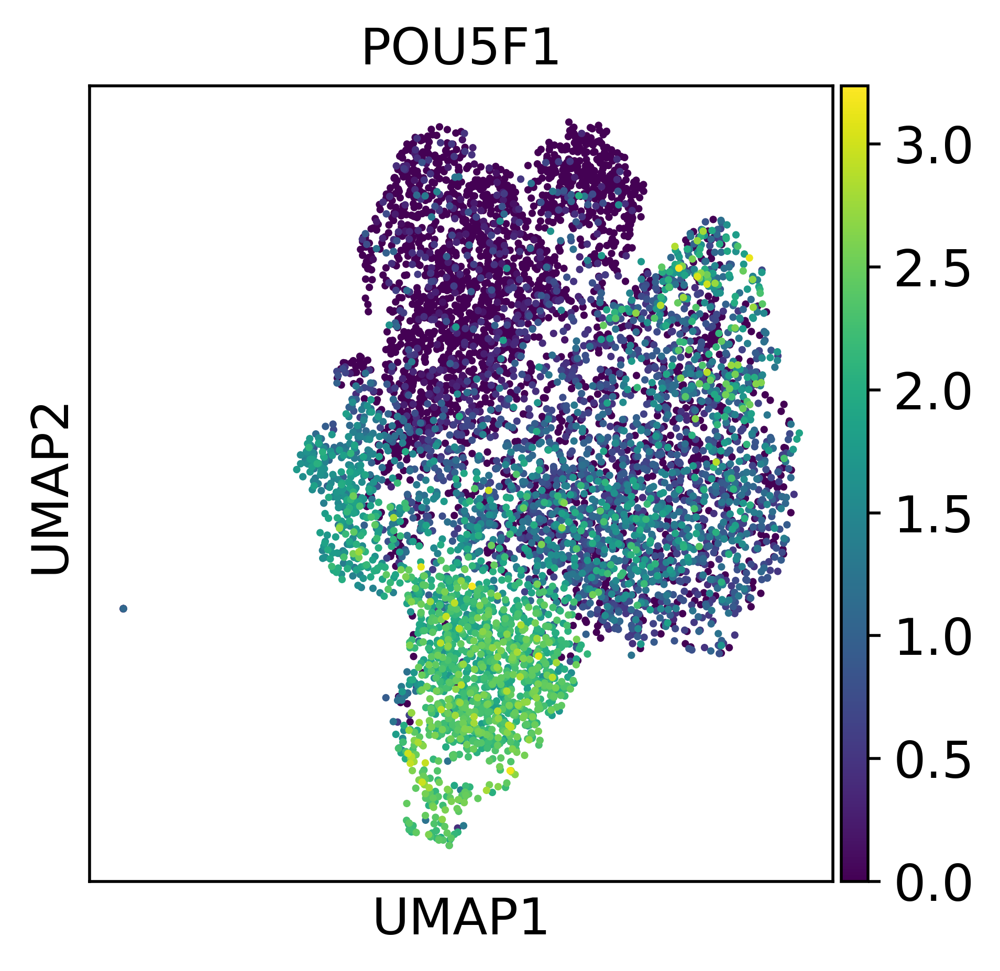

In [43]:
sc.pl.umap(adata, color='POU5F1', show=False)
plt.savefig('Figures/S2T_POU5F1.pdf', bbox_inches="tight")

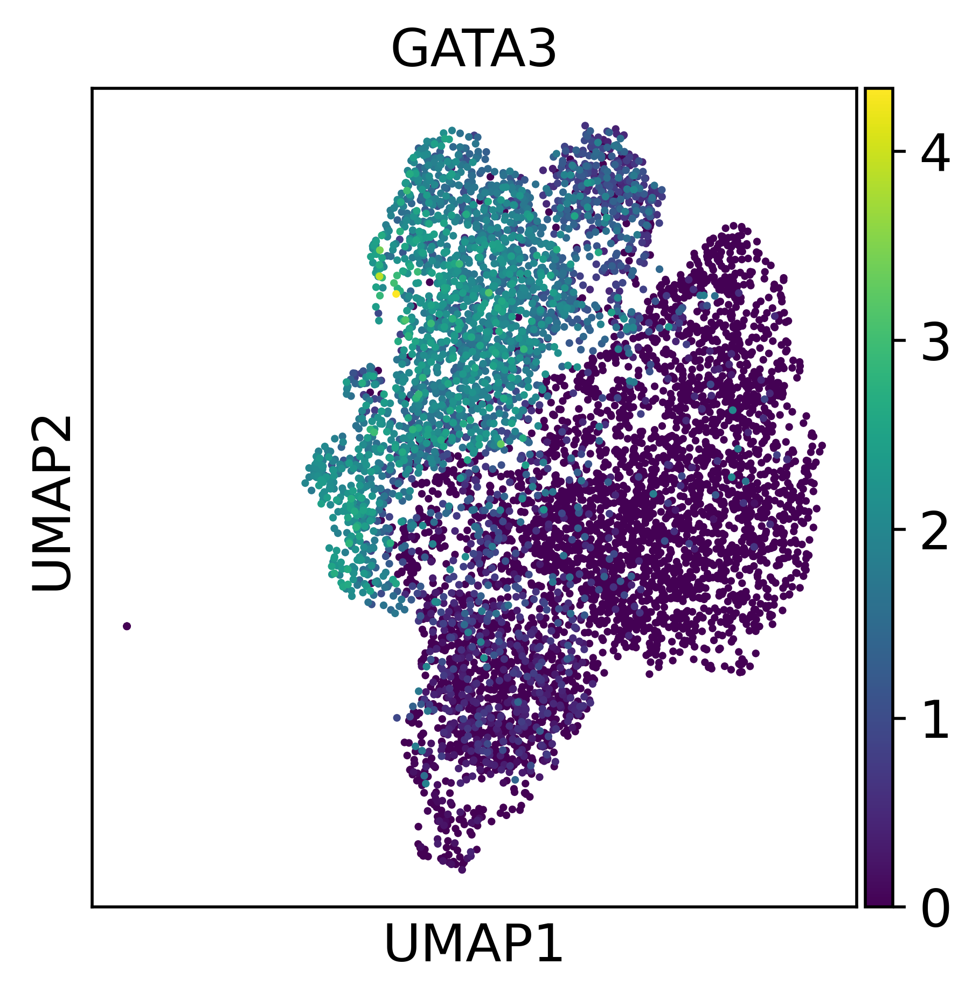

In [44]:
sc.pl.umap(adata, color='GATA3', show=False)
plt.savefig('Figures/S2T_GATA3.pdf', bbox_inches="tight")

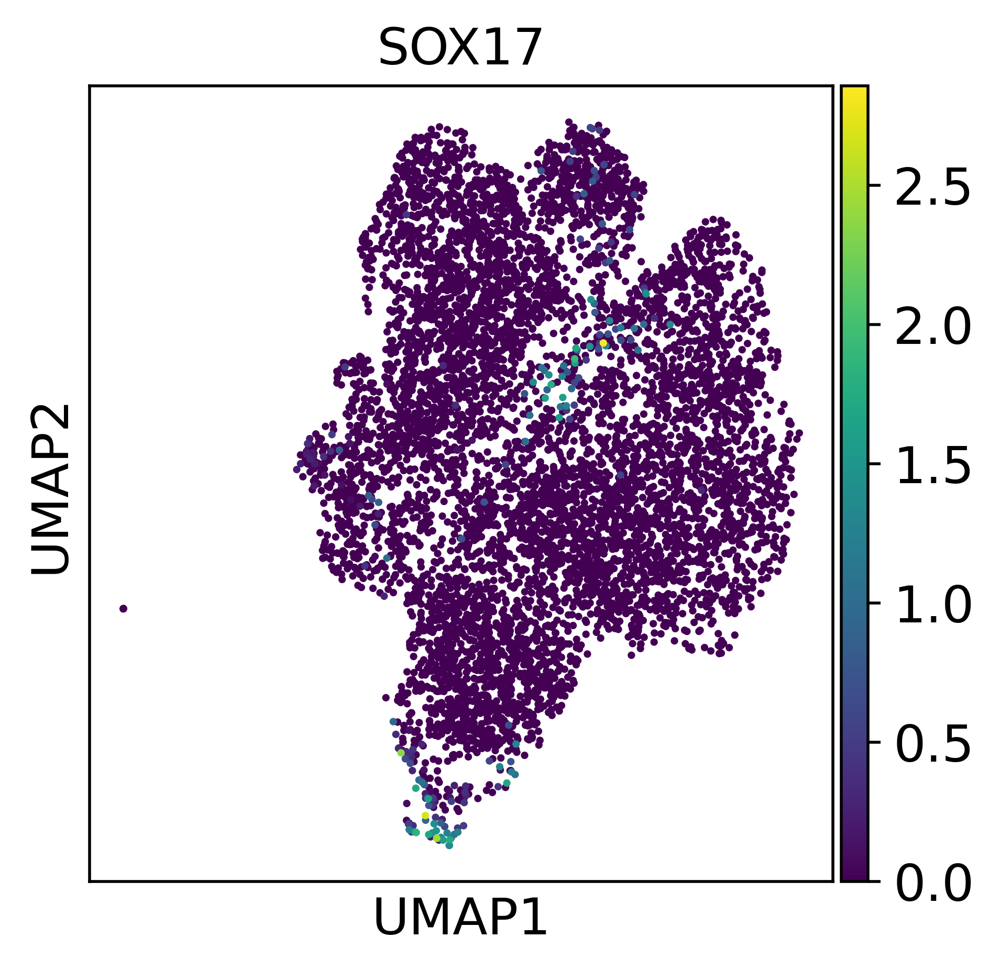

In [45]:
sc.pl.umap(adata, color='SOX17', show=False)
plt.savefig('Figures/S2T_SOX17.pdf', bbox_inches="tight")

# Annotation

In [46]:
sc.tl.leiden(adata, resolution=0.75)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [47]:
my_markers = {
    "EPI":['POU5F1', 'NANOG', 'SOX2', 'TDGF1', 'PRDM14', 'TDGF1', 'NODAL'],#, 'APOE', 'KLF2', 'SALL4', 'HAND1', 'CGA', 'PAX6'],
    "PE":['SOX17', 'GATA4', 'PDGFRA', 'HNF4A', 'FOXA2'],
    "TE":['GATA3', 'GATA2', 'DAB2', 'GRHL1', 'OVOL1'],
    "MEF": ["COL1A2", "COL6A3", "COL5A1", "FBLN1", "COL1A1", "COL6A2"],
    'Oocyte': ['PCP4L1', 'AURKA', 'WEE2', 'TCL1A', 'HIST1H1A']
    }

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: EPI, PE, TE, etc.


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


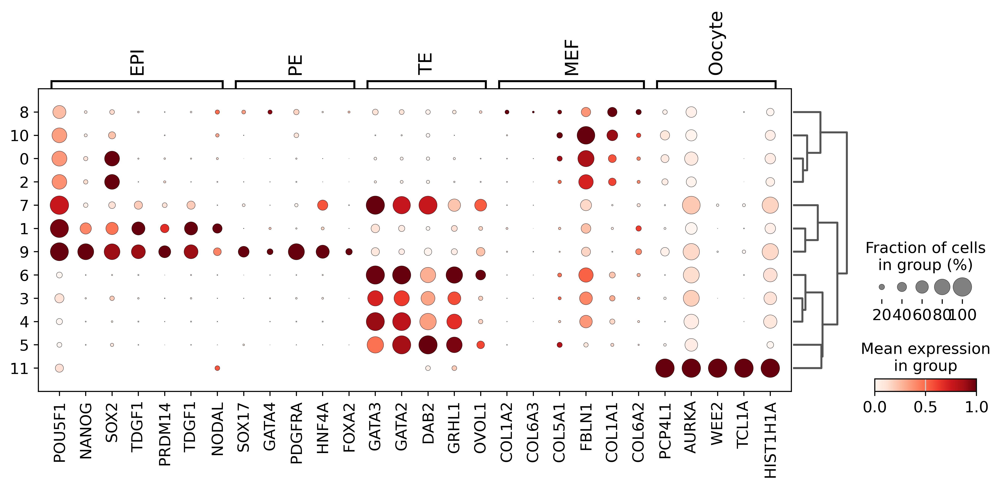

In [48]:
sc.tl.dendrogram(adata, groupby="leiden")
sc.pl.dotplot(adata, my_markers, 'leiden', dendrogram=True, use_raw=True, standard_scale='var')

In [49]:
lines_dict = {'0':'EPI', '1':'EPI', 
              '2':'EPI', '3':'TE', 
              '4':'TE', '5':'TE', 
              '6':'TE', '7':'TE', 
              '8':'HYPO', '9':'HYPO',
              '10':'HYPO', '11':'MEF',
              '12':'Oocyte'}

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


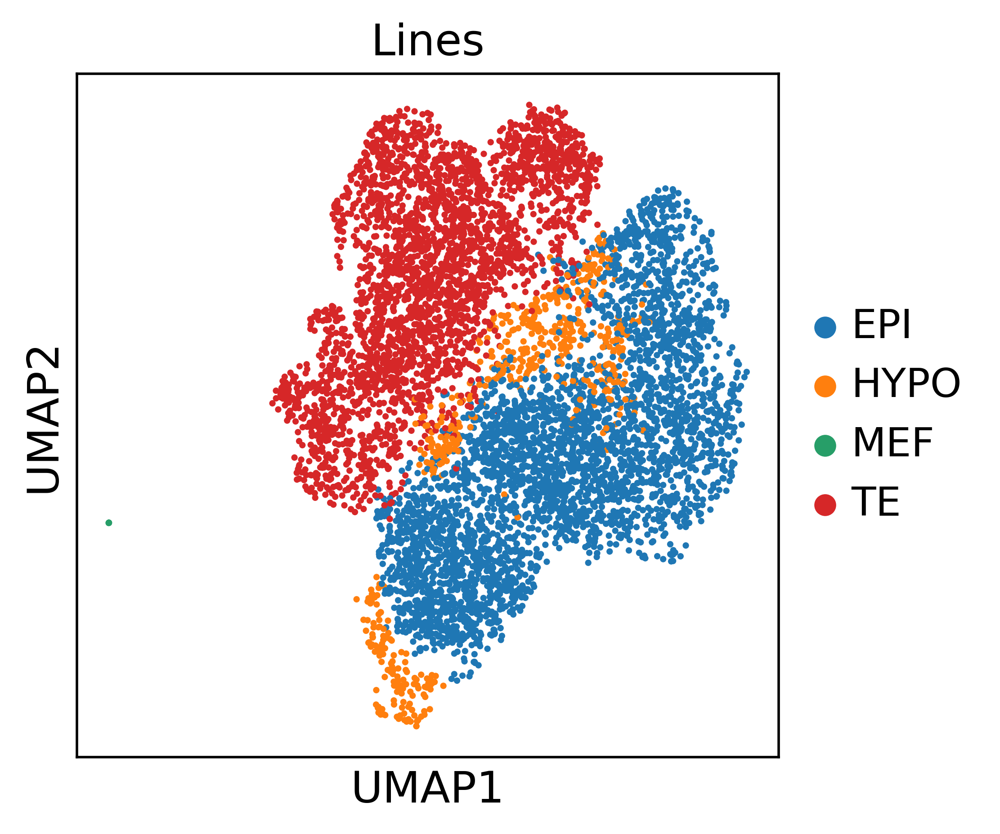

In [50]:
adata.obs['Lines'] = [lines_dict[i] for i in adata.obs.leiden]
sc.pl.umap(adata, color='Lines', show=False)
plt.savefig('Figures/S2T_lines.pdf', bbox_inches="tight")

# Violin plots

In [51]:
Signalling = {'FGF': [ 'FGF1', 'FGF2', 'FGFR1', 'FGFR2', 'MAPK1', 'MAPK3', 'MAPK14'],
             'TGFB': ['TGFB1', 'TGFB2','TGFBR1', 'SMAD2', 'SMAD3'],
             'BMP': ['BMP4','BMPR1A','BMPR1B','NOG','SMAD4','SMAD1'],
             'Activin':['INHBA', 'INHA','ACVR1B', 'ACVR1'], 
              'Anti Activin':['FST', 'FSTL1'], 
              'HIPPO': ['YAP1', 'TEAD2'],
             'WNT': ['RSPO3', 'CTNNB1', 'NLK', 'LRP6', 'GSK3A', 'GSK3B'], 
            'STAT': ['LIFR', 'LIF', 'IL6ST', 'IL6', 'STAT3'],
          'IGF': ['IGF1R', 'IGF2', 'IGFBP1','IGFBP2'],
             'EGF': ['EGFR']}

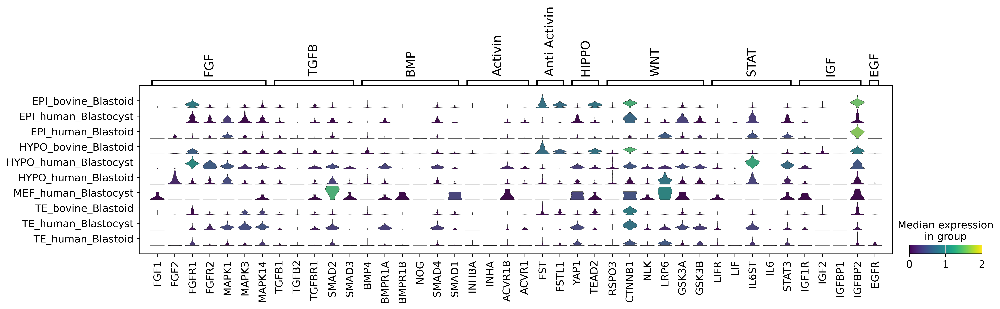

In [52]:
sc.pl.stacked_violin(adata, Signalling, groupby=['Lines', 'species', 'Origin'], dendrogram=False, rotation=90, vmax=2, cmap='viridis', show=False)
plt.savefig('Figures/S2U.pdf', bbox_inches="tight")

In [53]:
Pluripotency = {
    'Core': ['NANOG', 'POU5F1','MYC'],
    'Naive': [ 'PRDM1', 'KLF4', 'KLF5', 'TFCP2L1', 'DNMT3A'],
    'Primed': ['LIN28A', 'SALL4', 'OTX2', 'GATA6', 'GATA3', 'GATA4', 'SOX17']}

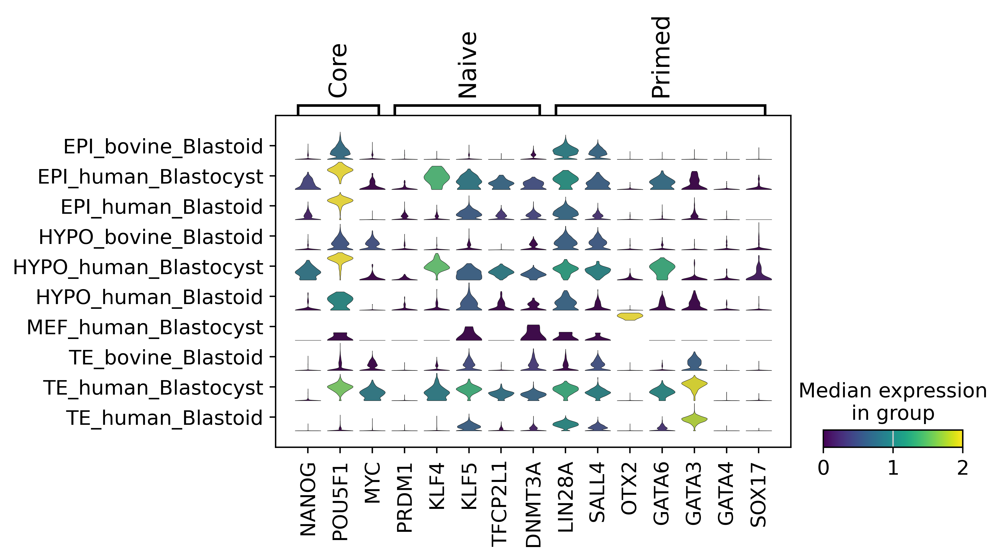

In [54]:
sc.pl.stacked_violin(adata, Pluripotency, groupby=['Lines', 'species', 'Origin'], dendrogram=False, rotation=90, vmax=2, cmap='viridis', show=False)
plt.savefig('Figures/S2V.pdf', bbox_inches="tight")